# 🔊 Trigger Word Detection — Model Training

In this notebook, we build and train a neural network model that detects whether the word **"activate"**
has been spoken in a 10-second audio clip.

### Model Overview
- **Input**: Spectrograms of shape (5511, 101) representing 10s audio
- **Architecture**:
  - 1D Convolution Layer to capture local time-based patterns
  - Bidirectional GRU Layers to model temporal dependencies
  - Dense + Sigmoid output layer across 1375 time steps
- **Output**: Binary predictions of shape (1375, 1), where each step represents ~7ms

### Data
- **Training Inputs**: `processed_data/train_X.npy`
- **Training Labels**: `processed_data/train_Y.npy`
- **Dev Inputs**: `XY_dev/X_dev.npy`
- **Dev Labels**: `XY_dev/Y_dev.npy`
- Labels indicate the presence of the trigger word at specific time steps

### Objective
Train a robust model that can accurately detect trigger word activations in noisy environments.

---


In [37]:
import numpy as np
from tensorflow.keras.callbacks import ModelCheckpoint
from tensorflow.keras.models import Model, load_model, Sequential
from tensorflow.keras.layers import Dense, Activation, Dropout, Input, Masking, TimeDistributed, LSTM, Conv1D
from tensorflow.keras.layers import GRU, Bidirectional, BatchNormalization, Reshape
from tensorflow.keras.optimizers import Adam
from tensorflow.keras import backend as K

from tensorflow.keras.models import model_from_json
import IPython
import os
import matplotlib.pyplot as plt
from pydub import AudioSegment

## Loading Dataset

In [2]:
X = np.load('processed_data/train_X.npy')  # shape: (m, 5511, 101)
Y = np.load('processed_data/train_Y.npy')  # shape: (m, 1375, 1)

# Load dev (validation) data
X_dev = np.load('XY_dev/X_dev.npy')        # shape: (m_dev, 5511, 101)
Y_dev = np.load('XY_dev/Y_dev.npy')        # shape: (m_dev, 1375, 1)

print(f"Train X shape: {X.shape}")
print(f"Train Y shape: {Y.shape}")
print(f"Dev X shape:   {X_dev.shape}")
print(f"Dev Y shape:   {Y_dev.shape}")

Train X shape: (100, 5511, 101)
Train Y shape: (100, 1375, 1)
Dev X shape:   (25, 5511, 101)
Dev Y shape:   (25, 1375, 1)


In [5]:
Tx, n_freq = X.shape[1], X.shape[2]
Ty = Y.shape[1]

## Model Architecture
The trigger word detection model is a deep neural network combining convolutional and recurrent layers, designed to learn temporal patterns in audio data and make frame-wise predictions.

#### Input Shape: (Tx, n_freq)
Spectrogram input representing 10 seconds of audio.

#### Model Layers
- 1D Convolutional Layer
- Filters: 196
- Kernel Size: 15
- Strides: 4
- Followed by Batch Normalization, ReLU activation, and Dropout (rate=0.8)
- Captures short-term temporal patterns in the audio signal.

##### **GRU Layer 1**

- Units: 128
- return_sequences=True to retain time dimension
- Followed by Dropout (rate=0.8) and Batch Normalization
- Learns temporal dependencies across the spectrogram.

##### **GRU Layer 2**

- Units: 128
- Followed by Dropout (rate=0.8) and Batch Normalization
- Deepens the model's understanding of long-term dependencies.

##### **TimeDistributed Dense Layer**

- Applies a Dense(1, activation='sigmoid') at each time step
- Outputs a sequence of probabilities for trigger word presence over time.

In [6]:
def modelf(input_shape):
    """
    Builds the trigger word detection model using Conv1D and stacked GRUs.

    Arguments:
    input_shape -- tuple, shape of the input (Tx, n_freq)

    Returns:
    model -- Keras Model instance
    """

    # Input layer
    X_input = Input(shape=input_shape)

    # 1D Convolutional layer
    X = Conv1D(filters=196, kernel_size=15, strides=4)(X_input)
    X = BatchNormalization()(X)
    X = Activation('relu')(X)
    X = Dropout(rate=0.8)(X)

    # First GRU layer
    X = GRU(units=128, return_sequences=True)(X)
    X = Dropout(rate=0.8)(X)
    X = BatchNormalization()(X)

    # Second GRU layer
    X = GRU(units=128, return_sequences=True)(X)
    X = Dropout(rate=0.8)(X)
    X = BatchNormalization()(X)
    X = Dropout(rate=0.8)(X)

    # TimeDistributed Dense layer with sigmoid activation
    X = TimeDistributed(Dense(1, activation='sigmoid'))(X)

    # Create model
    model = Model(inputs=X_input, outputs=X)

    return model

In [7]:
model = modelf(input_shape = (Tx, n_freq))

In [8]:
model.summary()

Model: "functional_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         [(None, 5511, 101)]       0         
_________________________________________________________________
conv1d (Conv1D)              (None, 1375, 196)         297136    
_________________________________________________________________
batch_normalization (BatchNo (None, 1375, 196)         784       
_________________________________________________________________
activation (Activation)      (None, 1375, 196)         0         
_________________________________________________________________
dropout (Dropout)            (None, 1375, 196)         0         
_________________________________________________________________
gru (GRU)                    (None, 1375, 128)         125184    
_________________________________________________________________
dropout_1 (Dropout)          (None, 1375, 128)        

it was trained on a GPU-enabled environment to accelerate convergence and handle the computational load of recurrent layers.

In [10]:
json_file = open('./model/model.json', 'r')
loaded_model_json = json_file.read()
json_file.close()
model = model_from_json(loaded_model_json)
model.load_weights('./model/model.h5')

In [11]:
model.summary()

Model: "model"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         [(None, 5511, 101)]       0         
_________________________________________________________________
conv1d (Conv1D)              (None, 1375, 196)         297136    
_________________________________________________________________
batch_normalization (BatchNo (None, 1375, 196)         784       
_________________________________________________________________
activation (Activation)      (None, 1375, 196)         0         
_________________________________________________________________
dropout (Dropout)            (None, 1375, 196)         0         
_________________________________________________________________
gru (GRU)                    (None, 1375, 128)         125184    
_________________________________________________________________
dropout_1 (Dropout)          (None, 1375, 128)         0     

In [12]:
model.layers

In [13]:
# Block Training for BatchNormalization Layers
model.layers[2].trainable = False
model.layers[7].trainable = False
model.layers[10].trainable = False

In [14]:
def f1_score(y_true, y_pred):
    """
    Custom F1-score metric for Keras
    """
    y_pred = K.round(y_pred)

    tp = K.sum(K.cast(y_true * y_pred, 'float'), axis=1)
    predicted_positives = K.sum(K.cast(y_pred, 'float'), axis=1)
    actual_positives = K.sum(K.cast(y_true, 'float'), axis=1)

    precision = tp / (predicted_positives + K.epsilon())
    recall = tp / (actual_positives + K.epsilon())

    f1 = 2 * (precision * recall) / (precision + recall + K.epsilon())
    return K.mean(f1)

In [15]:
opt = Adam(learning_rate=1e-6, beta_1=0.9, beta_2=0.999)

model.compile(
    loss='binary_crossentropy',
    optimizer=opt,
    metrics=["accuracy", f1_score]
)

In [16]:
model.fit(X, Y, batch_size = 16, epochs=10)

Epoch 1/10
7/7 [==============================] - 24s 3s/step - loss: 0.1678 - accuracy: 0.9488 - f1_score: 0.5043
Epoch 2/10
7/7 [==============================] - 20s 3s/step - loss: 0.1678 - accuracy: 0.9479 - f1_score: 0.4714
Epoch 3/10
7/7 [==============================] - 21s 3s/step - loss: 0.1667 - accuracy: 0.9492 - f1_score: 0.4893
Epoch 4/10
7/7 [==============================] - 19s 3s/step - loss: 0.1657 - accuracy: 0.9487 - f1_score: 0.5242
Epoch 5/10
7/7 [==============================] - 19s 3s/step - loss: 0.1622 - accuracy: 0.9503 - f1_score: 0.5077
Epoch 6/10
7/7 [==============================] - 20s 3s/step - loss: 0.1638 - accuracy: 0.9498 - f1_score: 0.5339
Epoch 7/10
7/7 [==============================] - 19s 3s/step - loss: 0.1600 - accuracy: 0.9504 - f1_score: 0.5461
Epoch 8/10
7/7 [==============================] - 19s 3s/step - loss: 0.1619 - accuracy: 0.9498 - f1_score: 0.5154
Epoch 9/10
7/7 [==============================] - 19s 3s/step - loss: 0.1623 - a

In [17]:
loss, acc, f1 = model.evaluate(X_dev, Y_dev)
print("Dev set accuracy = ", acc)

1/1 [==============================] - 0s 1ms/step - loss: 0.2019 - accuracy: 0.9171 - f1_score: 0.2533
Dev set accuracy =  0.9170618057250977


## Making Predictions

We have built a working model for trigger word detection, let's use it to make predictions. This code snippet runs audio (saved in a wav file) through the network. 

In [45]:
from utils import *

In [46]:
def detect_triggerword(filename):
    plt.subplot(2, 1, 1)
    
    # Correct the amplitude of the input file before prediction 
    audio_clip = AudioSegment.from_wav(filename)
    audio_clip = match_target_amplitude(audio_clip, -20.0)
    file_handle = audio_clip.export("tmp.wav", format="wav")
    filename = "tmp.wav"

    x = graph_spectrogram(filename)
    # the spectrogram outputs (freqs, Tx) and we want (Tx, freqs) to input into the model
    x  = x.swapaxes(0,1)
    x = np.expand_dims(x, axis=0)
    predictions = model.predict(x)
    
    plt.subplot(2, 1, 2)
    plt.plot(predictions[0,:,0])
    plt.ylabel('probability')
    plt.show()
    return predictions

In [47]:
chime_file = "chime.wav"
IPython.display.Audio(chime_file)

In [48]:
os.makedirs("output", exist_ok=True)

In [49]:
def chime_on_activate(filename, predictions, threshold):
    audio_clip = AudioSegment.from_wav(filename)
    chime = AudioSegment.from_wav(chime_file)
    Ty = predictions.shape[1]
    # Step 1: Initialize the number of consecutive output steps to 0
    consecutive_timesteps = 0
    i = 0
    # Step 2: Loop over the output steps in the y
    while i < Ty:
        # Step 3: Increment consecutive output steps
        consecutive_timesteps += 1
        # Step 4: If prediction is higher than the threshold for 20 consecutive output steps have passed
        if consecutive_timesteps > 20:
            # Step 5: Superpose audio and background using pydub
            audio_clip = audio_clip.overlay(chime, position = ((i / Ty) * audio_clip.duration_seconds) * 1000)
            # Step 6: Reset consecutive output steps to 0
            consecutive_timesteps = 0
            i = 75 * (i // 75 + 1)
            continue
        # if amplitude is smaller than the threshold reset the consecutive_timesteps counter
        if predictions[0, i, 0] < threshold:
            consecutive_timesteps = 0
        i += 1
        
    
    import time
    filename = f"chime_output_{int(time.time())}.wav"
    audio_clip.export(f"output/{filename}", format='wav')
    return filename

In [27]:
IPython.display.Audio("./raw_data/dev/1.wav")

In [28]:
IPython.display.Audio("./raw_data/dev/2.wav")

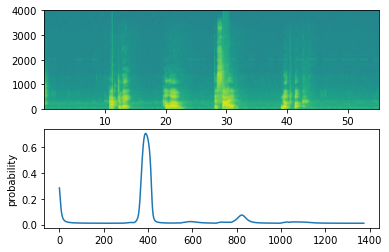

In [50]:
filename = "./raw_data/dev/1.wav"
prediction = detect_triggerword(filename)
out_filename = chime_on_activate(filename, prediction, 0.5)
IPython.display.Audio(f"output/{out_filename}")

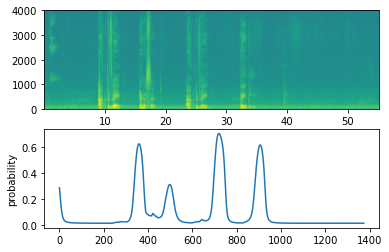

In [52]:
filename  = "./raw_data/dev/2.wav"
prediction = detect_triggerword(filename)
out_filename = chime_on_activate(filename, prediction, 0.5)
IPython.display.Audio(f"output/{out_filename}")

## Try Your Own Example!

* Record a 10 second audio clip of you saying the word "activate" and other random words, and upload it as `myaudio.wav`. 
* Be sure to upload the audio as a wav file. 
* If your audio recording is not 10 seconds, the code below will either trim or pad it as needed to make it 10 seconds. 

In [53]:
# Preprocess the audio to the correct format
def preprocess_audio(filename):
    # Trim or pad audio segment to 10000ms
    padding = AudioSegment.silent(duration=10000)
    segment = AudioSegment.from_wav(filename)[:10000]
    segment = padding.overlay(segment)
    # Set frame rate to 44100
    segment = segment.set_frame_rate(44100)
    # Export as wav
    segment.export(filename, format='wav')

In [54]:
your_filename = "raw_data/dev/1.wav"
preprocess_audio(your_filename)
IPython.display.Audio(your_filename) # listen to the audio you uploaded 

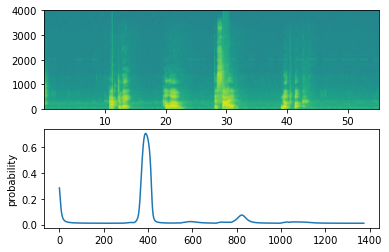

In [57]:
chime_threshold = 0.5
prediction = detect_triggerword(your_filename)
out_filename = chime_on_activate(your_filename, prediction, chime_threshold)
IPython.display.Audio(f"output/{out_filename}")